## Pythonic Sloth


## Issue 1: Too slow, less detailed
1. Takes about 112 to 117 seconds every time 
2. Plot is not as detailed, granular as %matplotlib inline (desired quality is something like below)
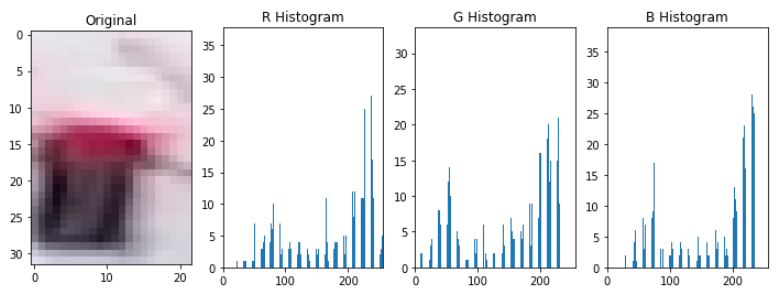

Below is the uber slow code, accessing about 1100 images (32x32 each) and plotting.. Please please help make it run faster..

In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import display, Image
import time
import cv2
from loaders import STANDARDIZED_LIST

# 3 rows, 4 cols
f, axArray = plt.subplots(3, 4, figsize=(7,3.5))


# MATPLOTLIB 'NOTEBOOK' BACKEND SPECIFIC
rc('animation', html='html5')
#plt.rcParams["animation.html"] = "jshtml"
f.tight_layout() # http://tiny.cc/adjust-subplot-spaces
plt.close()  # to avoid an additional empty plot which we do not want to see

# --------------------- PREPROCESSING HELPER FUNCTIONS ----------------------

def crop(image_list):
    """
    crop 5 px on either side vertically
    """
    image_cropped_list = []
    for each_image_label_pair in image_list:

        image =  each_image_label_pair[0]        
        image_cropped = image[:, 5:-5, :]
        image_cropped_list.append((image_cropped, each_image_label_pair[1]))
        
    print(len(image_cropped_list))
    return image_cropped_list
    

# create separate list images for each channel
def create_separate_lists(image_list):
    """
    Returns 3 separate list of each label (so no label attachment)
    """

    r_list = []
    y_list = []
    g_list = []    
    for each_image_label_pair in image_list:

        image = each_image_label_pair[0]
        label = each_image_label_pair[1]  # one hot encoded

        if label[0] == 1: # red
            r_list.append(image)
        elif label[1] == 1: # yellow
            y_list.append(image)        
        else: # green
            g_list.append(image)        

    return (r_list, y_list, g_list)   

# ----------------- PRE PROCESSING SECTION ---------------------------
    
# CROP THE IMAGES
STANDARDIZED_CROPPED_LIST = crop(STANDARDIZED_LIST)

# create separate lists for each label
(r_list, y_list, g_list) = create_separate_lists(STANDARDIZED_CROPPED_LIST)

#print(len(r_list), len(y_list), len(g_list))

# get max length (list which has max no of images)
max_list = max([len(r_list), len(y_list), len(g_list)])


# ----------------- ANIMATION SECTION ------------------------------
# TO VIEW ALL THE PREPROCESSED IMAGES AT ONCE..

# calculate histogram
def hsv_histograms(rgb_image):
    # Convert to HSV
    hsv = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HSV)

    # Create color channel histograms
    h_hist = np.histogram(hsv[:,:,0], bins=32, range=(0, 180))
    s_hist = np.histogram(hsv[:,:,1], bins=32, range=(0, 256))
    v_hist = np.histogram(hsv[:,:,2], bins=32, range=(0, 256))
    
    # Generating bin centers
    bin_edges = h_hist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    
    return bin_centers, h_hist, s_hist, v_hist

# initiate artists once
def initArtists():
    """
    To optimize performance, we use same artists, so they have to be initialized/created once
    like below and then re use in animation loop
    """
    axArtistsArray = [[plt.plot([],[]) for _ in range(4)] for _ in range(3)] 
    
    first_image_lists = [r_list[0], y_list[0], g_list[0]]    
    for i in range(3): # 3 rows        
        
        (bin_centers, h_hist, s_hist, v_hist) = hsv_histograms(first_image_lists[i])           
        
        axArtistsArray[i][0] = axArray[i][0].imshow(first_image_lists[i])                
        axArtistsArray[i][1] = axArray[i,1].bar(bin_centers,h_hist[0]) # bar(x, height)
        axArtistsArray[i][2] = axArray[i,2].bar(bin_centers,s_hist[0])
        axArtistsArray[i][3] = axArray[i,3].bar(bin_centers,v_hist[0])
        
        axArray[i,1].set_xlim(0,180)
        axArray[i,2].set_xlim(0,256)
        axArray[i,3].set_xlim(0,256)
        
    axArray[0,1].set_title('H channel')
    axArray[0,2].set_title('S channel')
    axArray[0,3].set_title('V channel')          
    
    return axArtistsArray

# animation function. This is called sequentially
def animate(i):

    # ensure no out of range in each lists
    r_index = i % len(r_list)
    y_index = i % len(y_list)
    g_index = i % len(g_list)
    
    first_image_lists = [r_list[r_index], y_list[y_index], g_list[g_index]]  
    
    for row_index in range(3): # 3 rows: 0, 1, 2
               
        # image    
        col_index = 0
        image = first_image_lists[row_index]        
        axArtistsArray[row_index][col_index].set_data(image)    

        (bin_centers, h_hist, s_hist, v_hist) = hsv_histograms(image)                   

        # H channel    
        col_index = 1
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(h_hist[0][each_bar_height])

        # S channel
        col_index = 2
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(s_hist[0][each_bar_height])    

        # V channel
        col_index = 3
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(v_hist[0][each_bar_height])         
        
    
    """
    axArtistsArray[0][0].set_data(r_list[r_index])
    axArtistsArray[1][0].set_data(y_list[y_index])
    axArtistsArray[2][0].set_data(g_list[g_index])
    """
    
    return (axArtistsArray,)  


# INITIATE ARTISTS
axArtistsArray = initArtists()

#plt.subplots_adjust(hspace=None)

# call the animator. 
start_time = time.time()
anim = animation.FuncAnimation(f, animate, frames=np.arange(0,max_list), interval=1000, blit=True)

# if output not cleared an empty output area created additionally...
from IPython.display import clear_output
clear_output()


anim

In [2]:
elapsed_time = time.time() - start_time
print('Elapsed time for above animation: {}'.format(elapsed_time))

Elapsed time for above animation: 115.36791229248047


## Issue 2: Blit=True throws error; False = double time

I get an error regarding set_animation if Blit is enabled. If Blit is disabled, then this code takes double the time (about 5 minutes) than last one., and only marginally better in quality. 

In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import display, Image, HTML
import time
import cv2
from loaders import STANDARDIZED_LIST

# 3 rows, 4 cols
f, axArray = plt.subplots(3, 4, figsize=(11,5.5))


# MATPLOTLIB 'NOTEBOOK' BACKEND SPECIFIC
#rc('animation', html='html5')
#plt.rcParams["animation.html"] = "jshtml"
f.tight_layout() # http://tiny.cc/adjust-subplot-spaces


# --------------------- PREPROCESSING HELPER FUNCTIONS ----------------------

def crop(image_list):
    """
    crop 5 px on either side vertically
    """
    image_cropped_list = []
    for each_image_label_pair in image_list:

        image =  each_image_label_pair[0]        
        image_cropped = image[:, 5:-5, :]
        image_cropped_list.append((image_cropped, each_image_label_pair[1]))
        
    print(len(image_cropped_list))
    return image_cropped_list
    

# create separate list images for each channel
def create_separate_lists(image_list):
    """
    Returns 3 separate list of each label (so no label attachment)
    """

    r_list = []
    y_list = []
    g_list = []    
    for each_image_label_pair in image_list:

        image = each_image_label_pair[0]
        label = each_image_label_pair[1]  # one hot encoded

        if label[0] == 1: # red
            r_list.append(image)
        elif label[1] == 1: # yellow
            y_list.append(image)        
        else: # green
            g_list.append(image)        

    return (r_list, y_list, g_list)   

# ----------------- PRE PROCESSING SECTION ---------------------------
    
# CROP THE IMAGES
STANDARDIZED_CROPPED_LIST = crop(STANDARDIZED_LIST)

# create separate lists for each label
(r_list, y_list, g_list) = create_separate_lists(STANDARDIZED_CROPPED_LIST)

#print(len(r_list), len(y_list), len(g_list))

# get max length (list which has max no of images)
max_list = max([len(r_list), len(y_list), len(g_list)])


# ----------------- ANIMATION SECTION ------------------------------
# TO VIEW ALL THE PREPROCESSED IMAGES AT ONCE..

# calculate histogram
def hsv_histograms(rgb_image):
    # Convert to HSV
    hsv = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HSV)

    # Create color channel histograms
    h_hist = np.histogram(hsv[:,:,0], bins=32, range=(0, 180))
    s_hist = np.histogram(hsv[:,:,1], bins=32, range=(0, 256))
    v_hist = np.histogram(hsv[:,:,2], bins=32, range=(0, 256))
    
    # Generating bin centers
    bin_edges = h_hist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    
    return bin_centers, h_hist, s_hist, v_hist

# initiate artists once
def initArtists():
    """
    To optimize performance, we use same artists, so they have to be initialized/created once
    like below and then re use in animation loop
    """
    axArtistsArray = [[plt.plot([],[]) for _ in range(4)] for _ in range(3)] 
    
    first_image_lists = [r_list[0], y_list[0], g_list[0]]    
    for i in range(3): # 3 rows        
        
        (bin_centers, h_hist, s_hist, v_hist) = hsv_histograms(first_image_lists[i])           
        
        axArtistsArray[i][0] = axArray[i][0].imshow(first_image_lists[i])                
        axArtistsArray[i][1] = axArray[i,1].bar(bin_centers,h_hist[0]) # bar(x, height)
        axArtistsArray[i][2] = axArray[i,2].bar(bin_centers,s_hist[0])
        axArtistsArray[i][3] = axArray[i,3].bar(bin_centers,v_hist[0])
        
        axArray[i,1].set_xlim(0,180)
        axArray[i,2].set_xlim(0,256)
        axArray[i,3].set_xlim(0,256)
        
    axArray[0,1].set_title('H channel')
    axArray[0,2].set_title('S channel')
    axArray[0,3].set_title('V channel')        
    
    return axArtistsArray

# animation function. This is called sequentially
def animate(i):

    # ensure no out of range in each lists
    r_index = i % len(r_list)
    y_index = i % len(y_list)
    g_index = i % len(g_list)
    
    first_image_lists = [r_list[r_index], y_list[y_index], g_list[g_index]]  
    
    for row_index in range(3): # 3 rows: 0, 1, 2
               
        # image    
        col_index = 0
        image = first_image_lists[row_index]        
        axArtistsArray[row_index][col_index].set_data(image)    

        (bin_centers, h_hist, s_hist, v_hist) = hsv_histograms(image)                   

        # H channel    
        col_index = 1
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(h_hist[0][each_bar_height])

        # S channel
        col_index = 2
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(s_hist[0][each_bar_height])    

        # V channel
        col_index = 3
        for each_bar_height, each_bar in enumerate(axArtistsArray[row_index][col_index]):
            each_bar.set_height(v_hist[0][each_bar_height])         
        
    
    """
    axArtistsArray[0][0].set_data(r_list[r_index])
    axArtistsArray[1][0].set_data(y_list[y_index])
    axArtistsArray[2][0].set_data(g_list[g_index])
    """
    
    return (axArtistsArray,)  


# INITIATE ARTISTS
axArtistsArray = initArtists()

#plt.subplots_adjust(hspace=None)

# call the animator. 
start_time = time.time()
anim = animation.FuncAnimation(f, animate, frames=np.arange(0,max_list), interval=1000, blit=False)

#if output not cleared an empty output area created additionally...
from IPython.display import clear_output
clear_output()

plt.close()  # to avoid an additional empty plot which we do not want to see
HTML(anim.to_html5_video())

In [4]:
elapsed_time = time.time() - start_time
print('Elapsed time for above animation: {}'.format(elapsed_time))

Elapsed time for above animation: 257.2307505607605
